In [16]:
import json
import math
from PIL import Image, ImageDraw
import requests
import time

In [117]:
def draw_annotations_on_image(annotations, image_path, output_path):
    """
    Draws polygons on the image based on the given annotations.

    :param annotations: List of annotations where each annotation is a string of coordinates.
    :param image_path: Path to the input image.
    :param output_path: Path to save the output image with drawn annotations.
    """
    try:
        # Open the image
        image = Image.open(image_path)
        print(image.size)
        draw = ImageDraw.Draw(image)
        
        # Process each annotation
        for annotation in annotations:
            # Split the annotation string into individual numbers
            coords = list(map(int, annotation.split()))
            
            # Extract the first 8 numbers as coordinates for the polygon
            if len(coords) >= 8:
                polygon = [(coords[i], coords[i+1]) for i in range(0, 8, 2)]
                
                # Draw the polygon on the image
                draw.polygon(polygon, outline="red", width=3)
        
        # Save the image with annotations
        image.save(output_path)
        print(f"Annotated image saved to {output_path}")
    
    except FileNotFoundError:
        print(f"The image at {image_path} was not found.")
    except IOError as e:
        print(f"An error occurred while processing the image: {e}")

def dota_to_annotations(annotations_list):
    """
    Converts the values of each dictionary in a list of annotations to integers and 
    concatenates them into a single string separated by spaces for each dictionary.

    :param annotations_list: List of dictionaries with annotation values.
    :return: A list of strings, each containing the concatenated integer values from a dictionary.
    """
    result_strings = []

    for dict in annotations_list:
        
        # Convert values to integers and concatenate them into a single string
        result_string = f'{int(dict["x1"])} {int(dict["y1"])} {int(dict["x2"])} {int(dict["y2"])} {int(dict["x3"])} {int(dict["y3"])} {int(dict["x4"])} {int(dict["y4"])}'
        
        # Add the result string to the list
        result_strings.append(result_string)

    return result_strings

In [74]:
def calculate_distance(bbox_width, bbox_height, image_width, image_height, real_world_width, real_world_height):
    """
    Calculate the distance from the camera to the object using the bounding box dimensions and camera specifications.

    Parameters:
    bbox_width (int): Width of the bounding box in pixels
    bbox_height (int): Height of the bounding box in pixels
    image_width (int): Width of the image in pixels
    image_height (int): Height of the image in pixels
    real_world_width (float): Real-world width of the object in meters
    real_world_height (float): Real-world height of the object in meters

    Returns:
    float: Estimated distance from the camera to the object in meters
    """
    # Camera parameters based on the documentation
    sensor_width = 12.8  # mm
    sensor_height = 9.6  # mm
    focal_length_equiv = 22  # mm (35 mm format equivalent)
    crop_factor = 2.7
    focal_length = focal_length_equiv / crop_factor  # actual focal length in mm

    # Convert focal length to meters
    focal_length_m = focal_length / 1000  # convert mm to meters

    # Calculate the pixel size in mm/pixel
    pixel_size_w = sensor_width / image_width
    pixel_size_h = sensor_height / image_height

    # Calculate the distance using the height of the bounding box and real-world height
    distance_height = (focal_length_m * real_world_height) / (bbox_height * pixel_size_h / 1000)
    
    # Calculate the distance using the width of the bounding box and real-world width
    distance_width = (focal_length_m * real_world_width) / (bbox_width * pixel_size_w / 1000)
    
    # Calculate the mean distance
    mean_distance = (distance_height + distance_width) / 2

    return mean_distance

## Example 1 - clock

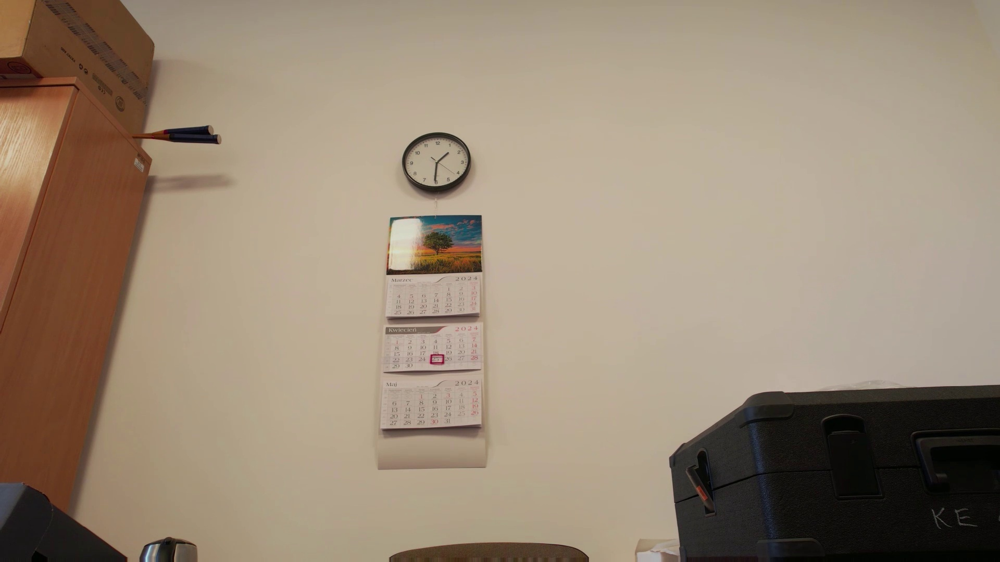

In [75]:
image_path = 'media/frame_144.jpg' 
image = Image.open(image_path)
image.save('/shared/testdata/frame_144.jpg')
display(image)

Detecting object

In [86]:
url = 'https://10.0.0.204:2053/detect_orcnn'
payload = json.dumps({
  "object": "clock",
  "imageData": "/shared/testdata/frame_144.jpg"
})
headers = {
  'Content-Type': 'application/json'
}
response = requests.request("POST", url, headers=headers, data=payload, verify=False)

/home/ubuntu/anaconda3/envs/maindetect/lib/python3.10/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host '10.0.0.204'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


Image size and real world

In [77]:
bboxes = response.json()["objects"]
annotations_dicts = [boxes["bounds"] for boxes in bboxes]
annotations = dota_to_annotations(annotations_dicts)

(1920, 1080)
Annotated image saved to media/output.png


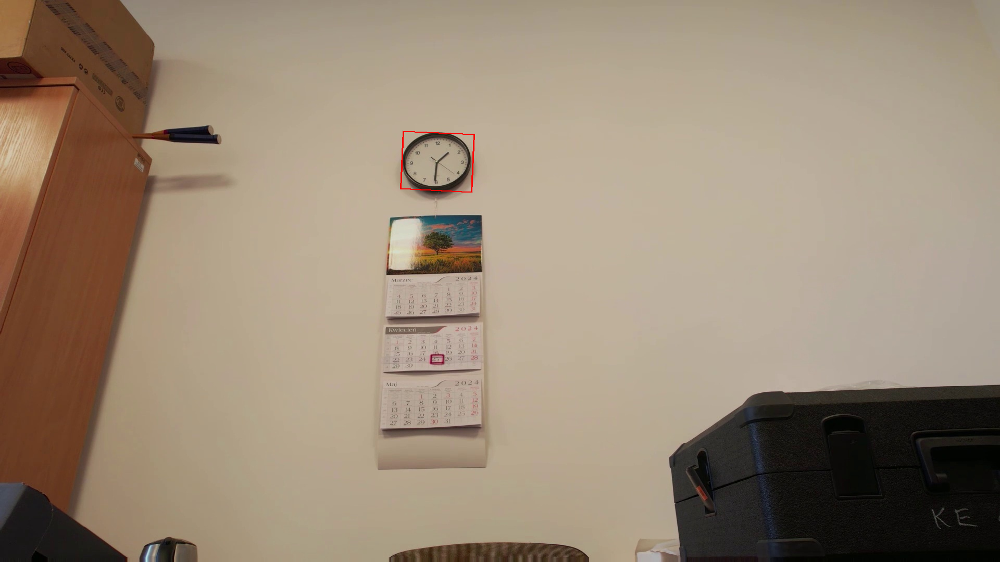

In [78]:
draw_annotations_on_image([annotations[2]], image_path, 'media/output.png')
image_path = 'media/output.png' 
image = Image.open(image_path)
display(image)

Let's suppose 0.3 meters as a standard width and height for a watch

In [82]:
clock_width = 0.3
clock_height = 0.3

In [83]:
box = annotations_dicts[2]

bbox_width = max(box["x1"], box["x2"], box["x3"], box["x4"]) - min(box["x1"], box["x2"], box["x3"], box["x4"])
bbox_height = max(box["y1"], box["y2"], box["y3"], box["y4"]) - min(box["y1"], box["y2"], box["y3"], box["y4"])
# Get the width and height of the image
image_width, image_height = image.size

In [84]:
distance = calculate_distance(bbox_width, bbox_height, image_width, image_height, clock_width, clock_height)
print(f"Estimated distance: {distance:.2f} meters")

Estimated distance: 2.44 meters


## Example 2 - airplane

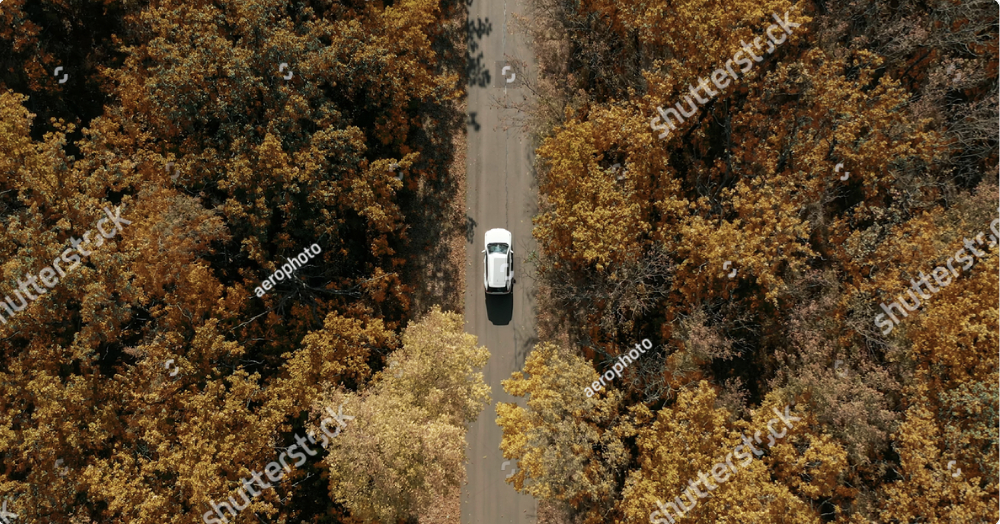

In [102]:
image_path = 'media/car.png' 
image = Image.open(image_path)
image.save('/shared/testdata/car.png')
display(image)

In [103]:
url = 'https://10.0.0.204:2053/detect_orcnn'
payload = json.dumps({
  "object": "car",
  "imageData": "/shared/testdata/frame_144.jpg"
})
headers = {
  'Content-Type': 'application/json'
}
response = requests.request("POST", url, headers=headers, data=payload, verify=False)

/home/ubuntu/anaconda3/envs/maindetect/lib/python3.10/site-packages/urllib3/connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host '10.0.0.204'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


In [121]:
bboxes[0]

{'bounds': {'x1': 818.468109289227,
  'x2': 853.1715410815996,
  'x3': 855.320464929523,
  'x4': 820.6170331371504,
  'y1': 682.6613617875788,
  'y2': 678.7829798482973,
  'y3': 698.0113677046087,
  'y4': 701.8897496438902},
 'confidence': 0.28371986746788025,
 'tagName': 'small-vehicle'}

In [104]:
bboxes = response.json()["objects"]
annotations_dicts = [boxes["bounds"] for boxes in bboxes]
annotations = dota_to_annotations(annotations_dicts)

(1686, 884)
Annotated image saved to media/output.png


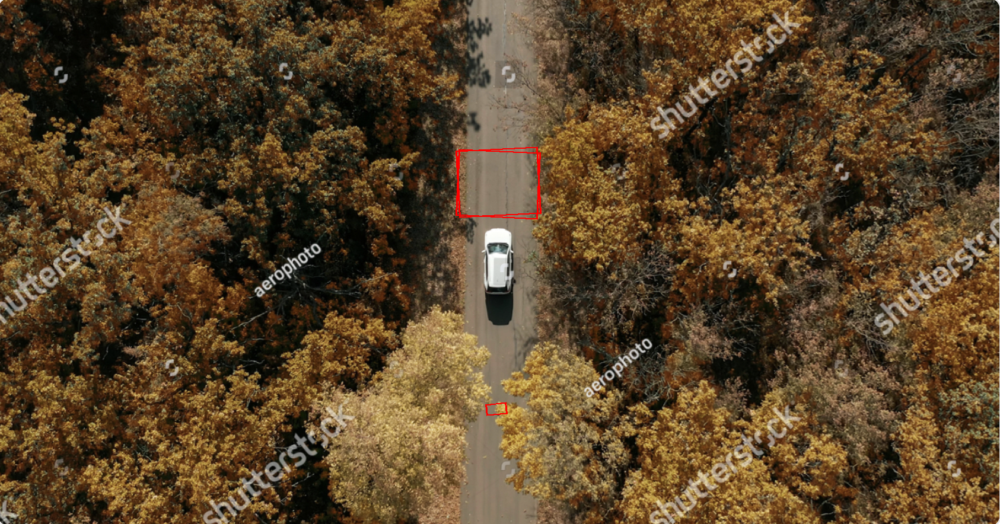

In [116]:
draw_annotations_on_image([annotations[4]], image_path, 'media/output.png')
image_path = 'media/output.png' 
image = Image.open(image_path)
display(image)

Let's suppose 4 x 1.8 meters as a standard width and height for a car

In [118]:
car_width = 4
car_height = 1.8

box = annotations_dicts[4]

bbox_width = max(box["x1"], box["x2"], box["x3"], box["x4"]) - min(box["x1"], box["x2"], box["x3"], box["x4"])
bbox_height = max(box["y1"], box["y2"], box["y3"], box["y4"]) - min(box["y1"], box["y2"], box["y3"], box["y4"])
# Get the width and height of the image
image_width, image_height = image.size

In [119]:
distance = calculate_distance(bbox_width, bbox_height, image_width, image_height, car_width, car_height)
print(f"Estimated distance: {distance:.2f} meters")

Estimated distance: 15.54 meters
